# python可视化————以《FIFA19球员价值回归分析及预测》为例

FIFA 19是一款足球模拟视频游戏，用户在其中可以控制真实世界足球队员的角色，每个角色都有一个总值范围在1-99的分数Overall用来代表他们的优秀程度，因此能在FIFA 19中用来比较和跟踪球员能力属性的增长。本次展示将从运球能力或耐力等各种球员属性来回归分析及预测一个足球运动员的整体价值

加载模块

In [1]:
import os

print(os.getcwd())#显示当前路径
#os.chdir('C:/Users/10371/Desktop/pynotes')#更改路径，''里面为更改的路径

c:\Users\10371\Desktop\pynotes


In [1]:
import pandas as pd
import numpy as np

# For Visualisation
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Pandas 数据框输出格式
# pd.options.display.float_format = '{:.1f}'.format
pd.set_option('display.max_rows', 40000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

# For 构建模型
import sklearn #机器学习包
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
#from sklearn.datasets import fetch_mldata
from sklearn import metrics
from RegscorePy import *

# To perform KMeans clustering
from sklearn.cluster import KMeans

# To perform Hierarchical clustering
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cut_tree

# Miscellaneous imports
from datetime import datetime
from scipy.stats import norm
import re

导入数据

In [5]:
fifa_df = pd.read_csv('data.csv')
fifa_df.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,€110.5M,€565K,2202,Left,5.0,4.0,4.0,Medium/ Medium,Messi,Yes,RF,10.0,"Jul 1, 2004",NaN,2021,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,€77M,€405K,2228,Right,5.0,4.0,5.0,High/ Low,C. Ronaldo,Yes,ST,7.0,"Jul 10, 2018",NaN,2022,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,€118.5M,€290K,2143,Right,5.0,5.0,5.0,High/ Medium,Neymar,Yes,LW,10.0,"Aug 3, 2017",NaN,2022,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,€72M,€260K,1471,Right,4.0,3.0,1.0,Medium/ Medium,Lean,Yes,GK,1.0,"Jul 1, 2011",NaN,2020,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,€102M,€355K,2281,Right,4.0,5.0,4.0,High/ High,Normal,Yes,RCM,7.0,"Aug 30, 2015",NaN,2023,5'11,154lbs,82+3,82+3,82+3,87+3,87+3,87+3,87+3,87+3,88+3,88+3,88+3,88+3,87+3,87+3,87+3,88+3,77+3,77+3,77+3,77+3,77+3,73+3,66+3,66+3,66+3,73+3,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [6]:
fifa_df.shape #原始数据集大小

(18207, 89)

### 数据预处理

In [7]:
# 去重
fifa_df.drop_duplicates(subset='Name', inplace=True)
print("数据去重后：",fifa_df.shape)

数据去重后： (17194, 89)


In [8]:
#删除不必要列(最后还是删掉'Wage','Value', 'Release Clause')
drop_col = ['Unnamed: 0','ID','Photo','Flag','Club Logo','Real Face','Loaned From','LS', 'ST', 'RS', 'LW', 'LF', 'CF', \
            'RF', 'RW', 'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM','RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB', \
            'LCB', 'CB', 'RCB', 'RB','Special','Wage','Value', 'Release Clause']
 
fifa_df = fifa_df.drop(drop_col, axis=1)
print("删除不必要列后：",fifa_df.shape)

删除不必要列后： (17194, 52)


处理空值

In [9]:
#检查每一列的空值

total = pd.DataFrame(fifa_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(fifa_df.isnull().sum()/fifa_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1)


,Total,Percentage
Joined,1462,8.50
Contract Valid Until,276,1.61
Club,231,1.34
Position,56,0.33
Jersey Number,56,0.33
Vision,45,0.26
Reactions,45,0.26
Balance,45,0.26
ShotPower,45,0.26
Jumping,45,0.26


In [10]:

#  Club 用 'None'填充空值
fifa_df['Club'].fillna('None', inplace = True)

#  Joined 用 '2019'填充空值
fifa_df['Joined'].fillna('2019', inplace = True)

# column Contract Valid Until删除空值
fifa_df = fifa_df.loc[~fifa_df['Contract Valid Until'].isnull()]

In [11]:
fifa_df.shape

(16918, 52)

In [12]:
#检查每一列的空值

total = pd.DataFrame(fifa_df.isnull().sum().sort_values(ascending=False), columns=['Total'])
percentage = pd.DataFrame(round(100*(fifa_df.isnull().sum()/fifa_df.shape[0]),2).sort_values(ascending=False)\
                          ,columns=['Percentage'])
pd.concat([total, percentage], axis = 1)

,Total,Percentage
Name,0,0.0
Age,0,0.0
Acceleration,0,0.0
SprintSpeed,0,0.0
Agility,0,0.0
Reactions,0,0.0
Balance,0,0.0
ShotPower,0,0.0
Jumping,0,0.0
Stamina,0,0.0


处理不同数据类型和字段

In [89]:
fifa_df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Preferred Foot               object
International Reputation    float64
Weak Foot                   float64
Skill Moves                 float64
Work Rate                    object
Body Type                    object
Position                     object
Jersey Number               float64
Joined                       object
Contract Valid Until         object
Height                       object
Weight                       object
Crossing                    float64
Finishing                   float64
HeadingAccuracy             float64
ShortPassing                float64
Volleys                     float64
Dribbling                   float64
Curve                       float64
FKAccuracy                  float64
LongPassing                 float64
BallControl                 

把身高单位改成m

In [13]:
#
def height_in_ms(ht):
    if str(ht).find('\'') == -1:
        height_in_ms = round(int(ht) * 0.3048, 2)
    else:
        height_ft = str(ht).split('\'')[0]
        height_inch = str(ht).split('\'')[1]
        height_in_inches = int(height_ft) * 12 + int(height_inch)
        height_in_ms = round(height_in_inches * 0.0254, 2)
    return height_in_ms

In [14]:
fifa_df['Height_in_ms'] = fifa_df['Height'].apply(lambda x:height_in_ms(x))

fifa_df = fifa_df.drop('Height', axis=1)

#fifa_df.head()

体重单位换成kg

In [15]:
def weight_in_kgs(wt):     
        weight_in_lbs = str(wt)[0:-3]
        weight_in_kgs = round(int(weight_in_lbs) * 0.453592, 2)
        return weight_in_kgs

In [16]:
fifa_df['Weight_in_kgs'] = fifa_df['Weight'].apply(lambda x:weight_in_kgs(x))

fifa_df = fifa_df.drop('Weight', axis=1)


#fifa_df.head()

In [94]:
# 处理 wage字段 单位是k
fifa_df['Wage_in_Th'] = fifa_df['Wage'].apply(lambda x:x[1:-1])

fifa_df = fifa_df.drop('Wage', axis=1)

#fifa_df.head()

KeyError: 'Wage'

In [15]:
#处理Value、Release Clause字段
def val_in_m(val):
    if str(val)[-1] == '0':
        val_in_mil = 0 
    elif str(val)[-1] == 'M':
        val_in_mil = str(val)[1:-1]   
    else:
        val_in_mil = round(int(val[1:-1])/1000, 2)
    return val_in_mil

In [16]:
#
fifa_df['Value_in_M'] = fifa_df['Value'].apply(lambda x:val_in_m(x))
fifa_df['Release_Clause_in_M'] = fifa_df['Release Clause'].apply(lambda x:val_in_m(x))

drop_columns = ['Value', 'Release Clause']
 
fifa_df = fifa_df.drop(drop_columns, axis=1)

#fifa_df.head()

In [17]:
# Int to string  转换成float64

fifa_df[['Wage_in_Th','Value_in_M','Release_Clause_in_M']] = \
fifa_df[['Wage_in_Th','Value_in_M','Release_Clause_in_M']].astype('float64')


fifa_df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Preferred Foot               object
International Reputation    float64
Weak Foot                   float64
Skill Moves                 float64
Work Rate                    object
Body Type                    object
Position                     object
Jersey Number               float64
Joined                       object
Contract Valid Until         object
Crossing                    float64
Finishing                   float64
HeadingAccuracy             float64
ShortPassing                float64
Volleys                     float64
Dribbling                   float64
Curve                       float64
FKAccuracy                  float64
LongPassing                 float64
BallControl                 float64
Acceleration                float64
SprintSpeed                 

In [17]:
#处理时间字段
fifa_df['Joined'] = fifa_df['Joined'].apply(lambda x:x[-4:])
fifa_df['Contract Valid Until'] = fifa_df['Contract Valid Until'].apply(lambda x:x[-4:])

#fifa_df.head()

In [18]:
# string to int

fifa_df[['Joined','Contract Valid Until']] = \
fifa_df[['Joined','Contract Valid Until']].astype('int64')

fifa_df.dtypes

Name                         object
Age                           int64
Nationality                  object
Overall                       int64
Potential                     int64
Club                         object
Preferred Foot               object
International Reputation    float64
Weak Foot                   float64
Skill Moves                 float64
Work Rate                    object
Body Type                    object
Position                     object
Jersey Number               float64
Joined                        int64
Contract Valid Until          int64
Crossing                    float64
Finishing                   float64
HeadingAccuracy             float64
ShortPassing                float64
Volleys                     float64
Dribbling                   float64
Curve                       float64
FKAccuracy                  float64
LongPassing                 float64
BallControl                 float64
Acceleration                float64
SprintSpeed                 

处理不合理的数据：删除`Contract Valid Until` < `Joined`

In [19]:
print(fifa_df.loc[fifa_df['Contract Valid Until'] < fifa_df['Joined']].shape[0])

134


In [20]:
fifa_df = fifa_df.loc[fifa_df['Contract Valid Until'] >= fifa_df['Joined']]

print(fifa_df.loc[fifa_df['Contract Valid Until'] < fifa_df['Joined']].shape[0])

0


添加新字段：rs_left_on_contract、Good_Yrs_left

In [21]:
col_index = fifa_df.columns.get_loc('Contract Valid Until') + 1
fifa_df.insert(loc=col_index,column='Yrs_left_on_contract',value=fifa_df['Contract Valid Until'] \
                    - fifa_df['Joined'])

#fifa_df.head()

In [22]:
col_index = fifa_df.columns.get_loc('Age') + 1
fifa_df.insert(loc=col_index,column='Good_Yrs_left',value= 35 - fifa_df['Age'])

#fifa_df.head()

处理 Body Type字段

In [23]:
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'C. Ronaldo', 'Lean', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Akinfenwa', 'Stocky', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Messi', 'Lean', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Shaqiri', 'Stocky', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Neymar', 'Lean', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'PLAYER_BODY_TYPE_25', 'Normal', fifa_df['Body Type'])
fifa_df['Body Type'] = np.where(fifa_df['Body Type'] == 'Courtois', 'Lean', fifa_df['Body Type'])
#fifa_df.head()

添加新字段Age_Group：划分年龄层

In [24]:
# Segmenting the Discount% into various bins

def age_binning(df,cut_points,label_names):
    column_index = df.columns.get_loc('Age') + 1
    df.insert(loc=column_index,column='Age_Group',value=pd.cut(df['Age'],cut_points,labels=label_names, include_lowest=True))
    return df

cut_points = [15,20,25,30,35,40,45]
label_names = ["Below 20","Between 20-25","Between 25-30","Between 30-35","Between 35-40","Above 40"]

fifa_df = age_binning(fifa_df,cut_points,label_names)
#fifa_df.head()

position列划分成四类：'Goalkeeper','Defender','Midfielder','Attacker'

In [25]:
'''col_index = fifa_org_df.columns.get_loc('Body_Type_Stocky') + 1

fifa_org_df.insert(loc=col_index,column='Position Grouped',value = 0)'''

fifa_df['Position Grouped'] = np.select(
    [
        fifa_df['Position'].str.contains('GK'),
        fifa_df['Position'].str.endswith('B'),
        fifa_df['Position'].str.endswith('M') | fifa_df['Position'].str.endswith('W'),
        fifa_df['Position'].str.contains('ST') | fifa_df['Position'].str.endswith('F')
    ], 
    [
        'Goalkeeper',
        'Defender',
        'Midfielder',
        'Attacker'
    ], 
    default='Unknown'
)


In [26]:
# 把unknown行删掉
fifa_df = fifa_df.loc[fifa_df['Position Grouped']!='Unknown']

In [27]:
fifa_df.shape


(16393, 56)

In [28]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Position Grouped
0,L. Messi,31,Between 30-35,4,Argentina,94,94,FC Barcelona,Left,5.0,4.0,4.0,Medium/ Medium,Lean,RF,10.0,2004,2021,17,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,1.70,72.12,Attacker
1,Cristiano Ronaldo,33,Between 30-35,2,Portugal,94,94,Juventus,Right,5.0,4.0,5.0,High/ Low,Lean,ST,7.0,2018,2022,4,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,1.88,83.01,Attacker
2,Neymar Jr,26,Between 25-30,9,Brazil,92,93,Paris Saint-Germain,Right,5.0,5.0,5.0,High/ Medium,Lean,LW,10.0,2017,2022,5,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,1.75,68.04,Midfielder
3,De Gea,27,Between 25-30,8,Spain,91,93,Manchester United,Right,4.0,3.0,1.0,Medium/ Medium,Lean,GK,1.0,2011,2020,9,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,1.93,76.20,Goalkeeper
4,K. De Bruyne,27,Between 25-30,8,Belgium,91,92,Manchester City,Right,4.0,5.0,4.0,High/ High,Normal,RCM,7.0,2015,2023,8,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,1.80,69.85,Midfielder


打乱数据集

In [29]:
np.random.seed(111)
fifa_df = fifa_df.reindex(np.random.permutation(fifa_df.index))
fifa_df.shape

(16393, 56)

In [30]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Position Grouped
2480,M. Diop,30,Between 25-30,5,Senegal,74,74,Beijing Renhe FC,Right,1.0,3.0,3.0,Medium/ Low,Normal,ST,39.0,2018,2019,1,61.0,75.0,78.0,68.0,66.0,73.0,52.0,58.0,61.0,68.0,68.0,74.0,67.0,72.0,55.0,72.0,81.0,77.0,86.0,66.0,51.0,46.0,76.0,69.0,67.0,69.0,31.0,46.0,31.0,13.0,14.0,6.0,6.0,11.0,1.88,89.81,Attacker
17881,R. Hauge,16,Below 20,19,Norway,52,67,FK Bodø/Glimt,Right,1.0,2.0,2.0,Medium/ Medium,Normal,CM,34.0,2017,2020,3,34.0,46.0,46.0,58.0,46.0,51.0,50.0,30.0,54.0,54.0,67.0,65.0,77.0,48.0,65.0,52.0,60.0,31.0,55.0,49.0,48.0,49.0,38.0,52.0,41.0,48.0,48.0,50.0,47.0,6.0,9.0,11.0,11.0,9.0,1.75,69.85,Midfielder
7884,Z. Dedič,33,Between 30-35,2,Slovenia,67,67,FC Wacker Innsbruck,Right,2.0,3.0,3.0,Medium/ Medium,Normal,ST,9.0,2017,2019,2,59.0,67.0,57.0,60.0,64.0,67.0,62.0,61.0,54.0,68.0,75.0,69.0,72.0,66.0,69.0,73.0,68.0,70.0,68.0,67.0,72.0,33.0,62.0,63.0,70.0,61.0,32.0,32.0,30.0,16.0,15.0,9.0,16.0,9.0,1.83,77.11,Attacker
8740,R. Tafazolli,26,Between 25-30,9,England,67,68,Peterborough United,Left,1.0,2.0,2.0,Medium/ High,Normal,LCB,5.0,2016,2019,3,38.0,18.0,68.0,56.0,35.0,41.0,22.0,40.0,46.0,54.0,60.0,61.0,54.0,64.0,60.0,37.0,68.0,69.0,86.0,39.0,54.0,65.0,21.0,31.0,32.0,60.0,67.0,68.0,65.0,16.0,13.0,14.0,13.0,15.0,1.96,92.99,Defender
14083,J. Chianese,28,Between 25-30,7,Australia,61,61,Perth Glory,Right,1.0,2.0,2.0,Medium/ High,Normal,RM,7.0,2016,2019,3,51.0,59.0,42.0,61.0,65.0,58.0,61.0,52.0,50.0,64.0,59.0,69.0,70.0,61.0,63.0,60.0,48.0,66.0,63.0,54.0,35.0,38.0,64.0,59.0,55.0,59.0,30.0,34.0,45.0,15.0,16.0,7.0,10.0,9.0,1.75,74.84,Midfielder


偏态监测

In [31]:
# Checking outliers at 25%,50%,75%,90%,95% and 99%

fifa_df.describe(percentiles=[.25,.5,.75,.90,.95,.99]).T

,count,mean,std,min,25%,50%,75%,90%,95%,99%,max
Age,16393.0,25.123467,4.676831,16.00,21.00,25.00,28.00,32.00,33.00,36.00,44.00
Good_Yrs_left,16393.0,9.876533,4.676831,-9.00,7.00,10.00,14.00,16.00,17.00,18.00,19.00
Overall,16393.0,66.317392,6.954497,46.00,62.00,66.00,71.00,75.00,78.00,83.00,94.00
Potential,16393.0,71.377966,6.174165,48.00,67.00,71.00,75.00,80.00,82.00,87.00,95.00
International Reputation,16393.0,1.116574,0.398740,1.00,1.00,1.00,1.00,1.00,2.00,3.00,5.00
Weak Foot,16393.0,2.948332,0.660595,1.00,3.00,3.00,3.00,4.00,4.00,5.00,5.00
Skill Moves,16393.0,2.359056,0.760023,1.00,2.00,2.00,3.00,3.00,4.00,4.00,5.00
Jersey Number,16393.0,19.678460,16.072190,1.00,8.00,17.00,26.00,35.00,44.00,91.00,99.00
Joined,16393.0,2016.600073,2.143778,1998.00,2016.00,2017.00,2018.00,2018.00,2019.00,2019.00,2019.00
Contract Valid Until,16393.0,2020.163301,1.279838,2018.00,2019.00,2020.00,2021.00,2022.00,2023.00,2023.00,2026.00


修正某些数值型变量的偏态分布

In [110]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Position Grouped
2480,M. Diop,30,Between 25-30,5,Senegal,74,74,Beijing Renhe FC,Right,1.0,3.0,3.0,Medium/ Low,Normal,ST,39.0,2018,2019,1,61.0,75.0,78.0,68.0,66.0,73.0,52.0,58.0,61.0,68.0,68.0,74.0,67.0,72.0,55.0,72.0,81.0,77.0,86.0,66.0,51.0,46.0,76.0,69.0,67.0,69.0,31.0,46.0,31.0,13.0,14.0,6.0,6.0,11.0,1.88,89.81,Attacker
17881,R. Hauge,16,Below 20,19,Norway,52,67,FK Bodø/Glimt,Right,1.0,2.0,2.0,Medium/ Medium,Normal,CM,34.0,2017,2020,3,34.0,46.0,46.0,58.0,46.0,51.0,50.0,30.0,54.0,54.0,67.0,65.0,77.0,48.0,65.0,52.0,60.0,31.0,55.0,49.0,48.0,49.0,38.0,52.0,41.0,48.0,48.0,50.0,47.0,6.0,9.0,11.0,11.0,9.0,1.75,69.85,Midfielder
7884,Z. Dedič,33,Between 30-35,2,Slovenia,67,67,FC Wacker Innsbruck,Right,2.0,3.0,3.0,Medium/ Medium,Normal,ST,9.0,2017,2019,2,59.0,67.0,57.0,60.0,64.0,67.0,62.0,61.0,54.0,68.0,75.0,69.0,72.0,66.0,69.0,73.0,68.0,70.0,68.0,67.0,72.0,33.0,62.0,63.0,70.0,61.0,32.0,32.0,30.0,16.0,15.0,9.0,16.0,9.0,1.83,77.11,Attacker
8740,R. Tafazolli,26,Between 25-30,9,England,67,68,Peterborough United,Left,1.0,2.0,2.0,Medium/ High,Normal,LCB,5.0,2016,2019,3,38.0,18.0,68.0,56.0,35.0,41.0,22.0,40.0,46.0,54.0,60.0,61.0,54.0,64.0,60.0,37.0,68.0,69.0,86.0,39.0,54.0,65.0,21.0,31.0,32.0,60.0,67.0,68.0,65.0,16.0,13.0,14.0,13.0,15.0,1.96,92.99,Defender
14083,J. Chianese,28,Between 25-30,7,Australia,61,61,Perth Glory,Right,1.0,2.0,2.0,Medium/ High,Normal,RM,7.0,2016,2019,3,51.0,59.0,42.0,61.0,65.0,58.0,61.0,52.0,50.0,64.0,59.0,69.0,70.0,61.0,63.0,60.0,48.0,66.0,63.0,54.0,35.0,38.0,64.0,59.0,55.0,59.0,30.0,34.0,45.0,15.0,16.0,7.0,10.0,9.0,1.75,74.84,Midfielder


In [32]:
#数值型变量
num_cols = ['Overall','Crossing','Finishing','HeadingAccuracy','ShortPassing','Volleys','Dribbling','Curve','FKAccuracy','LongPassing', \
        'BallControl','Acceleration','SprintSpeed','Agility','Reactions','Balance','ShotPower','Jumping','Stamina','Strength', \
        'LongShots','Aggression','Interceptions','Positioning','Vision','Penalties','Composure','Marking','StandingTackle', \
        'SlidingTackle','GKDiving','GKHandling','GKKicking','GKPositioning','GKReflexes',
        'Age', 'Height_in_ms', 'Weight_in_kgs','Yrs_left_on_contract','Good_Yrs_left']

len(num_cols)

40

In [36]:
# 数值型变量的箱线图

#Function to plot the distribution plot of the numeric variable list
def univariate_continuos(var_list):
    plt.figure(figsize=(15,8))
    for var in var_list:
        plt.subplot(5,8,var_list.index(var)+1)
        sns.boxplot(y=var,palette='cubehelix', data=fifa_df)
    # Automatically adjust subplot params so that the subplotS fits in to the figure area.
    plt.tight_layout()
    # display the plot
    plt.show()
    


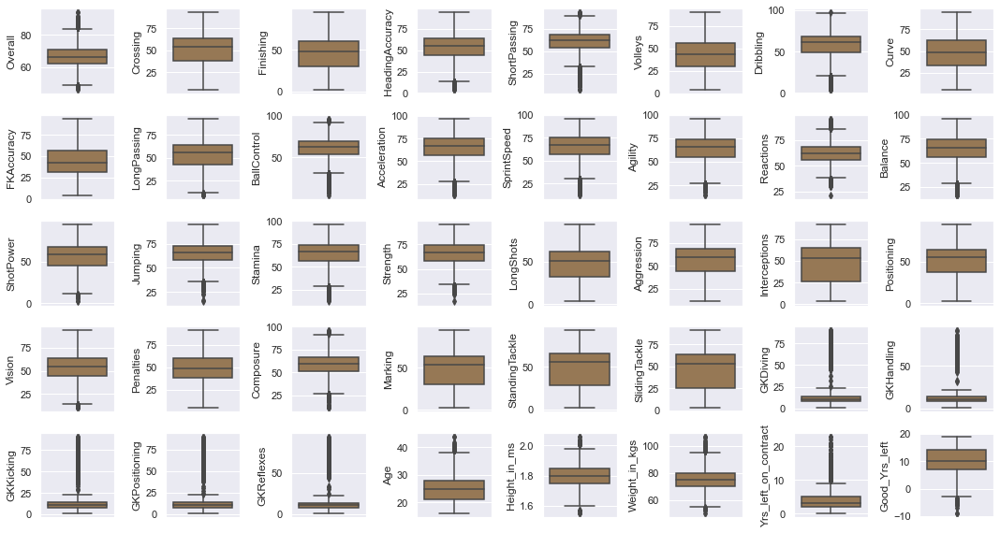

In [37]:
univariate_continuos(num_cols)  

In [116]:
fifa_df.shape

(16393, 56)

#### 处理偏态

In [38]:
log_cols = ['Yrs_left_on_contract','GKDiving','GKHandling','GKKicking','GKPositioning','GKReflexes']

In [39]:
#
sns.set_style("darkgrid") # white/whitegrid/dark/ticks
sns.set_context("paper") # talk/poster

#Function to plot the distribution plot of the numeric variable list
def univariate_continuos(var_list):
    plt.figure(figsize=(10,6))
    for var in var_list:
        plt.subplot(2,3,var_list.index(var)+1)
        sns.boxplot(y=var,palette='cubehelix', data=fifa_df)
    # Automatically adjust subplot params so that the subplotS fits in to the figure area.
    plt.tight_layout()
    # display the plot
    plt.show()

#Function to plot the distribution plot of the numeric variable list
def distplots(var_list):
    plt.figure(figsize=(10,6))
    for var in var_list:
        plt.subplot(2,3,var_list.index(var)+1)
        sns.distplot(fifa_df[var], fit=norm, kde=False, hist=False)
    # Automatically adjust subplot params so that the subplotS fits in to the figure area.
    plt.tight_layout()
    # display the plot
    plt.show()
    

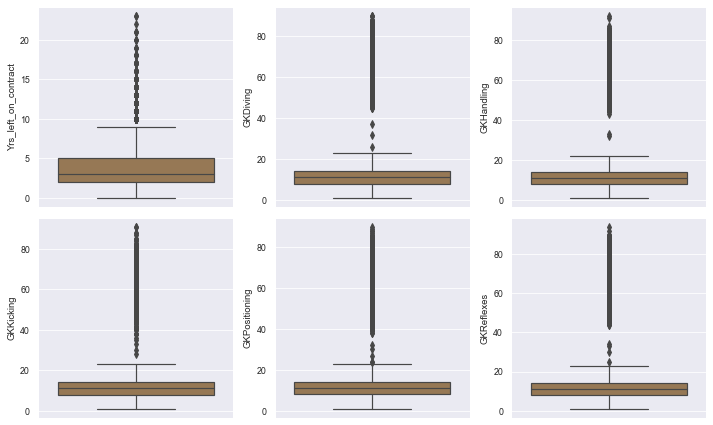

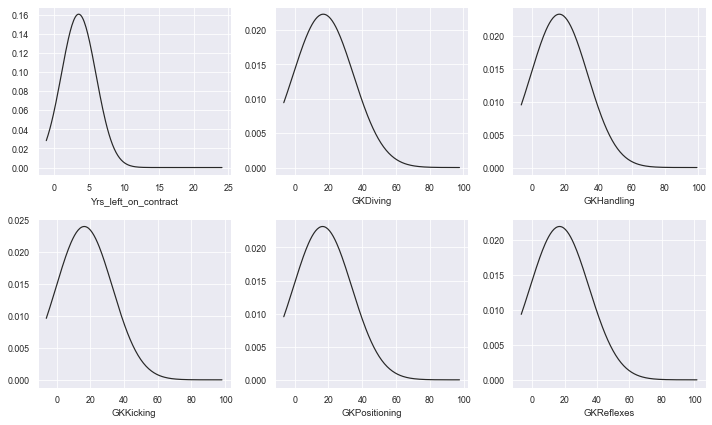

In [40]:
#处理偏态前
univariate_continuos(log_cols)
distplots(log_cols)

Skew in 'Yrs_left_on_contract' before log transformation is 1.557406:
Skew in 'GKDiving' before log transformation is 2.407066:
Skew in 'GKHandling' before log transformation is 2.399794:
Skew in 'GKKicking' before log transformation is 2.397452:
Skew in 'GKPositioning' before log transformation is 2.431127:
Skew in 'GKReflexes' before log transformation is 2.418801:


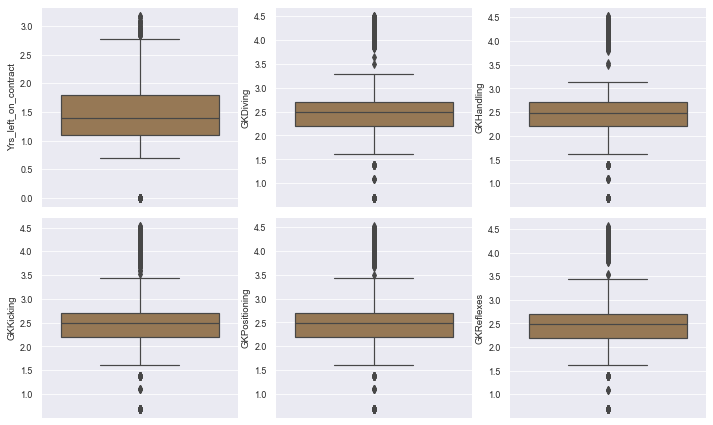

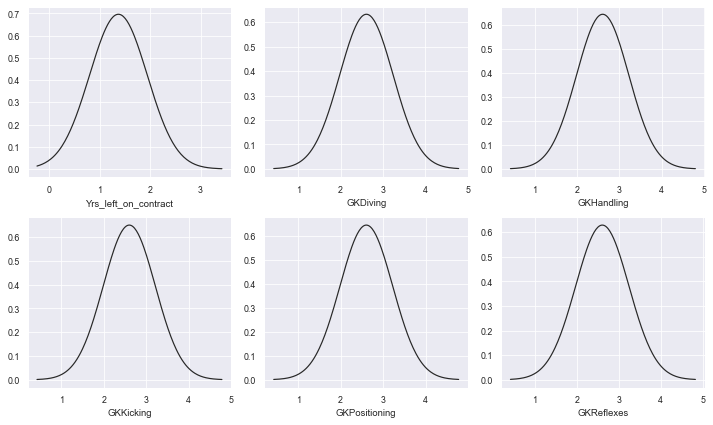

Skew in 'Yrs_left_on_contract' after log transformation is -0.610263:
Skew in 'GKDiving' after log transformation is 1.552728:
Skew in 'GKHandling' after log transformation is 1.523246:
Skew in 'GKKicking' after log transformation is 1.500561:
Skew in 'GKPositioning' after log transformation is 1.530954:
Skew in 'GKReflexes' after log transformation is 1.561630:


In [41]:
# Determining the Skewness of data prior to log transformation
print ("Skew in 'Yrs_left_on_contract' before log transformation is %f:" % fifa_df['Yrs_left_on_contract'].skew())
print ("Skew in 'GKDiving' before log transformation is %f:" % fifa_df['GKDiving'].skew())
print ("Skew in 'GKHandling' before log transformation is %f:" % fifa_df['GKHandling'].skew())
print ("Skew in 'GKKicking' before log transformation is %f:" % fifa_df['GKKicking'].skew())
print ("Skew in 'GKPositioning' before log transformation is %f:" % fifa_df['GKPositioning'].skew())
print ("Skew in 'GKReflexes' before log transformation is %f:" % fifa_df['GKReflexes'].skew())

# 对数变换
#We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
fifa_df["Yrs_left_on_contract"] = np.log1p(fifa_df["Yrs_left_on_contract"])
fifa_df["GKDiving"] = np.log1p(fifa_df["GKDiving"])
fifa_df["GKHandling"] = np.log1p(fifa_df["GKHandling"])
fifa_df["GKKicking"] = np.log1p(fifa_df["GKKicking"])
fifa_df["GKPositioning"] = np.log1p(fifa_df["GKPositioning"])
fifa_df["GKReflexes"] = np.log1p(fifa_df["GKReflexes"])


#处理偏态后
univariate_continuos(log_cols)
distplots(log_cols)

# 
print ("Skew in 'Yrs_left_on_contract' after log transformation is %f:" % fifa_df['Yrs_left_on_contract'].skew())
print ("Skew in 'GKDiving' after log transformation is %f:" % fifa_df['GKDiving'].skew())
print ("Skew in 'GKHandling' after log transformation is %f:" % fifa_df['GKHandling'].skew())
print ("Skew in 'GKKicking' after log transformation is %f:" % fifa_df['GKKicking'].skew())
print ("Skew in 'GKPositioning' after log transformation is %f:" % fifa_df['GKPositioning'].skew())
print ("Skew in 'GKReflexes' after log transformation is %f:" % fifa_df['GKReflexes'].skew())


log变换后数据分布接近正态了

## 数据可视化分析

可视化描述

In [42]:
fifa_df.shape

(16393, 56)

In [122]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Position Grouped
2480,M. Diop,30,Between 25-30,5,Senegal,74,74,Beijing Renhe FC,Right,1.0,3.0,3.0,Medium/ Low,Normal,ST,39.0,2018,2019,0.693147,61.0,75.0,78.0,68.0,66.0,73.0,52.0,58.0,61.0,68.0,68.0,74.0,67.0,72.0,55.0,72.0,81.0,77.0,86.0,66.0,51.0,46.0,76.0,69.0,67.0,69.0,31.0,46.0,31.0,2.639057,2.708050,1.945910,1.945910,2.484907,1.88,89.81,Attacker
17881,R. Hauge,16,Below 20,19,Norway,52,67,FK Bodø/Glimt,Right,1.0,2.0,2.0,Medium/ Medium,Normal,CM,34.0,2017,2020,1.386294,34.0,46.0,46.0,58.0,46.0,51.0,50.0,30.0,54.0,54.0,67.0,65.0,77.0,48.0,65.0,52.0,60.0,31.0,55.0,49.0,48.0,49.0,38.0,52.0,41.0,48.0,48.0,50.0,47.0,1.945910,2.302585,2.484907,2.484907,2.302585,1.75,69.85,Midfielder
7884,Z. Dedič,33,Between 30-35,2,Slovenia,67,67,FC Wacker Innsbruck,Right,2.0,3.0,3.0,Medium/ Medium,Normal,ST,9.0,2017,2019,1.098612,59.0,67.0,57.0,60.0,64.0,67.0,62.0,61.0,54.0,68.0,75.0,69.0,72.0,66.0,69.0,73.0,68.0,70.0,68.0,67.0,72.0,33.0,62.0,63.0,70.0,61.0,32.0,32.0,30.0,2.833213,2.772589,2.302585,2.833213,2.302585,1.83,77.11,Attacker
8740,R. Tafazolli,26,Between 25-30,9,England,67,68,Peterborough United,Left,1.0,2.0,2.0,Medium/ High,Normal,LCB,5.0,2016,2019,1.386294,38.0,18.0,68.0,56.0,35.0,41.0,22.0,40.0,46.0,54.0,60.0,61.0,54.0,64.0,60.0,37.0,68.0,69.0,86.0,39.0,54.0,65.0,21.0,31.0,32.0,60.0,67.0,68.0,65.0,2.833213,2.639057,2.708050,2.639057,2.772589,1.96,92.99,Defender
14083,J. Chianese,28,Between 25-30,7,Australia,61,61,Perth Glory,Right,1.0,2.0,2.0,Medium/ High,Normal,RM,7.0,2016,2019,1.386294,51.0,59.0,42.0,61.0,65.0,58.0,61.0,52.0,50.0,64.0,59.0,69.0,70.0,61.0,63.0,60.0,48.0,66.0,63.0,54.0,35.0,38.0,64.0,59.0,55.0,59.0,30.0,34.0,45.0,2.772589,2.833213,2.079442,2.397895,2.302585,1.75,74.84,Midfielder


In [34]:
def density_plot(col_name):
    plt.figure(figsize=(8,6))
    sns.set(style="darkgrid")
    ax = sns.histplot(fifa_df[col_name],kde = True)
    # 调整xlabel的字体大小
    ax.xaxis.label.set_size(15)
    # 调整ylabel的字体大小
    ax.yaxis.label.set_size(15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.show()

观察Overall的密度分布

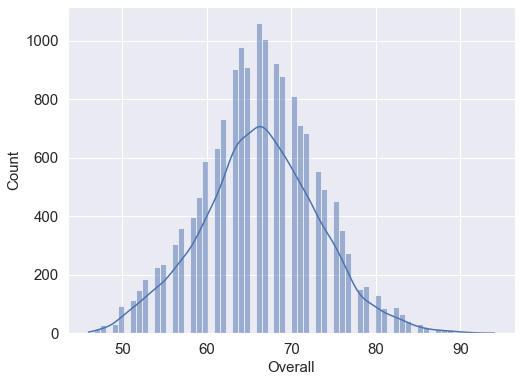

In [43]:
density_plot('Overall')

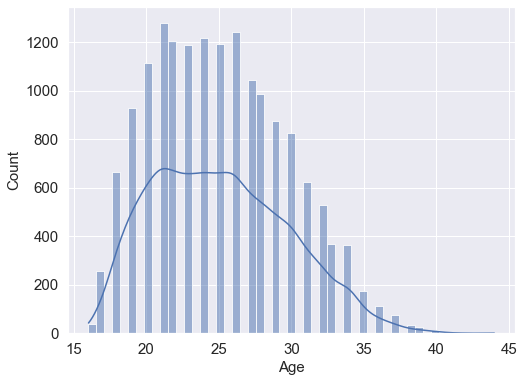

In [35]:
density_plot('Age')

In [45]:
fifa_df['Position'].nunique()

25

Overall vs 部分其他变量（按需画）

Age_Group——年龄（组）

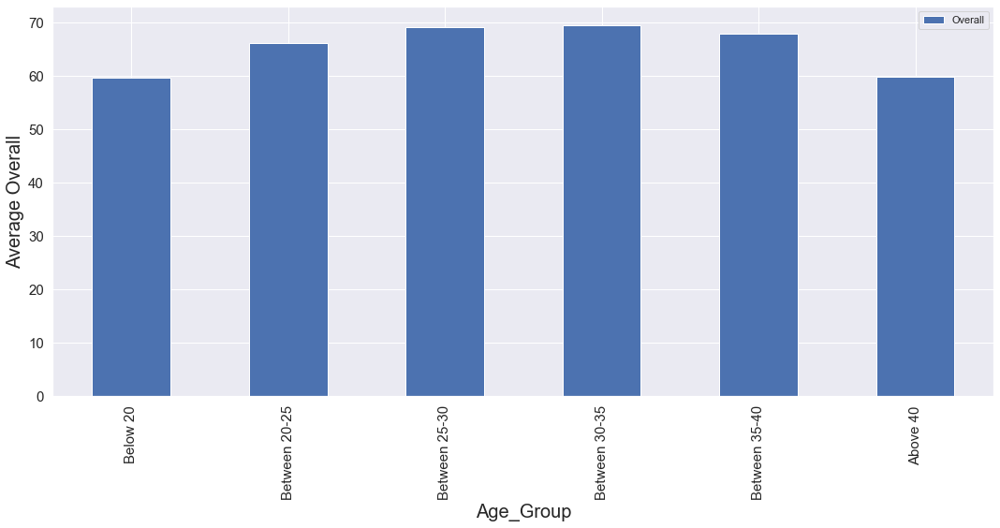

In [125]:
age_group = pd.DataFrame(fifa_df.groupby('Age_Group')['Overall'].mean())

age_group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Age_Group',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

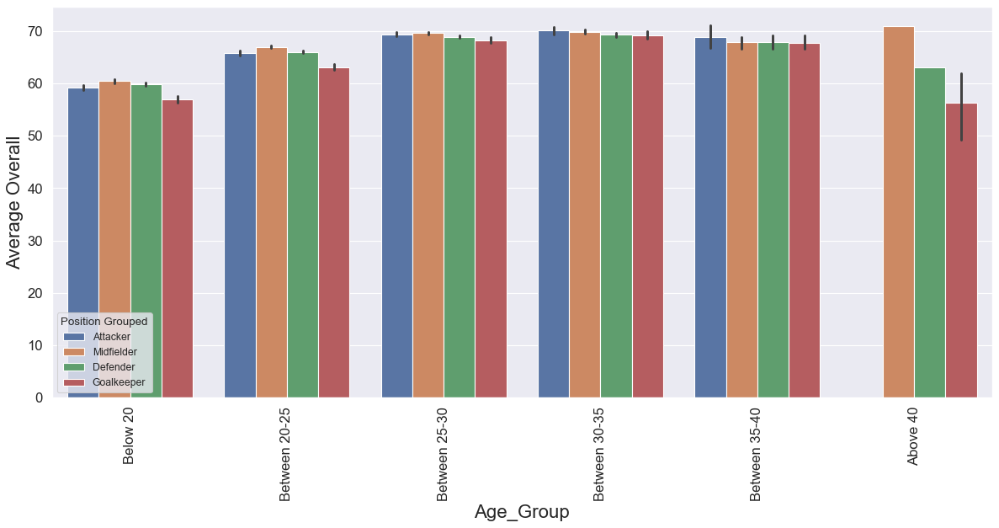

In [127]:
#年龄按照球员位置细分（不确定要不要）
plt.figure(figsize=(15, 8), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.barplot(x='Age_Group', y='Overall',hue ='Position Grouped', data=fifa_df, estimator=np.mean)

plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Age_Group',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Position Grouped——球员位置

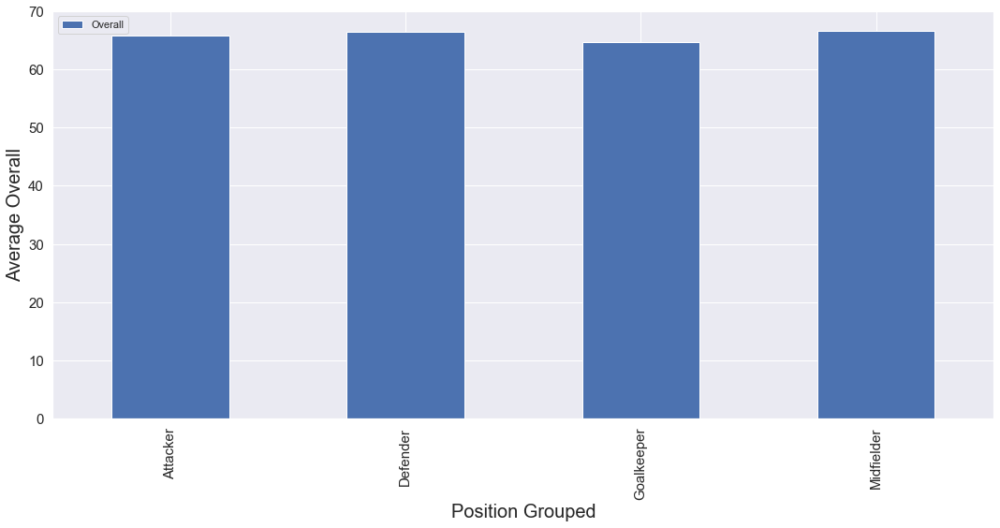

In [126]:
group = pd.DataFrame(fifa_df.groupby('Position Grouped')['Overall'].mean())

group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Position Grouped',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Work Rate——球员在上半场/下半场的投入程度

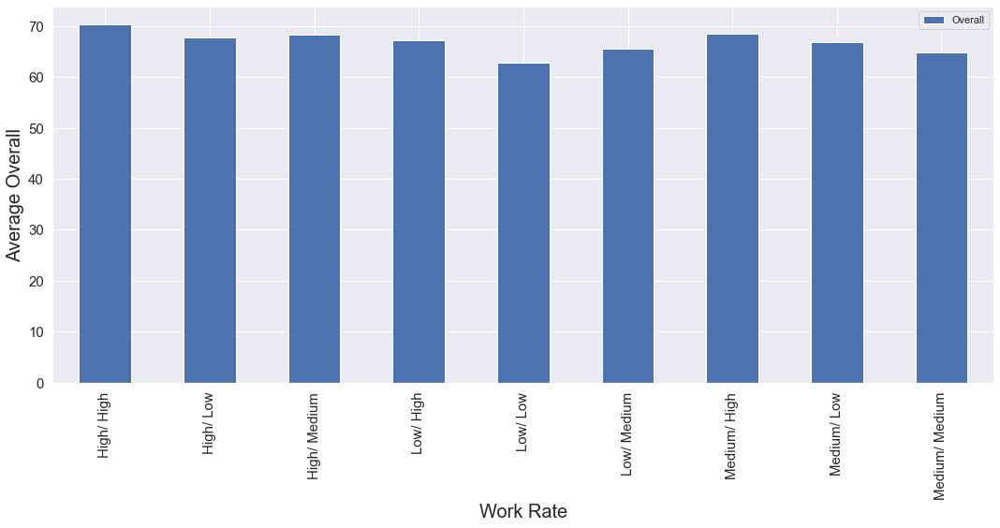

In [128]:
Work_Rate_group = pd.DataFrame(fifa_df.groupby('Work Rate')['Overall'].mean())


Work_Rate_group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Work Rate',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

International Reputation——网络知名度

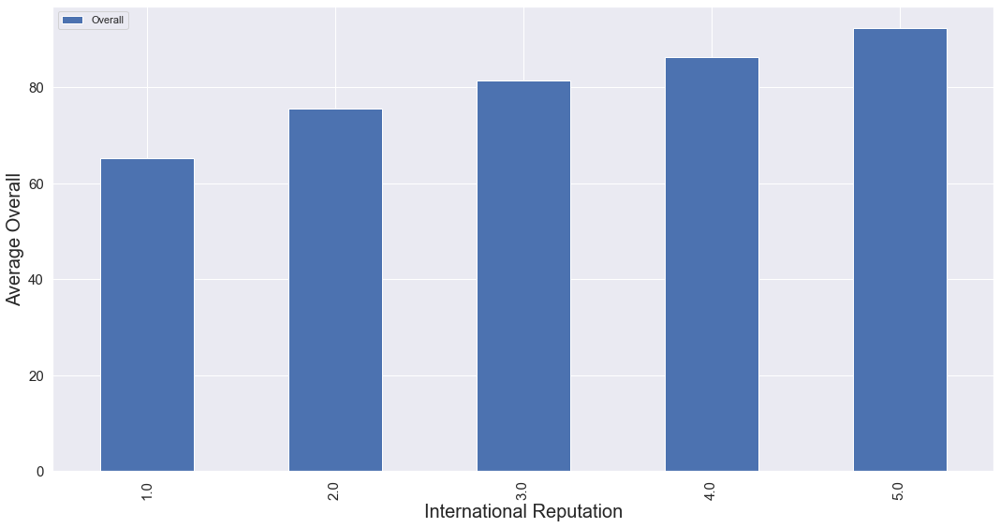

In [129]:
group = pd.DataFrame(fifa_df.groupby('International Reputation')['Overall'].mean())

group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('International Reputation',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Skill Moves——技术等级

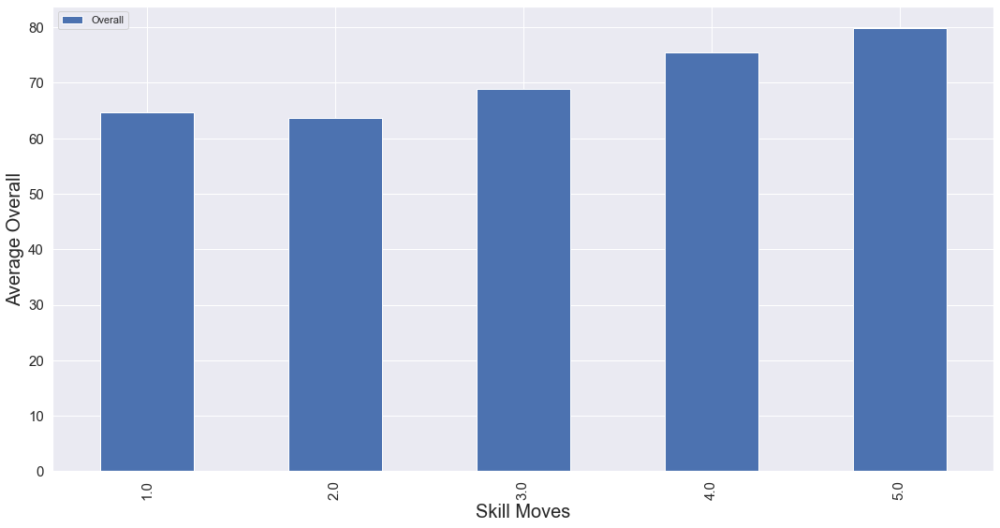

In [130]:
group = pd.DataFrame(fifa_df.groupby('Skill Moves')['Overall'].mean())

group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Skill Moves',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Weak Foot——非惯用脚精度

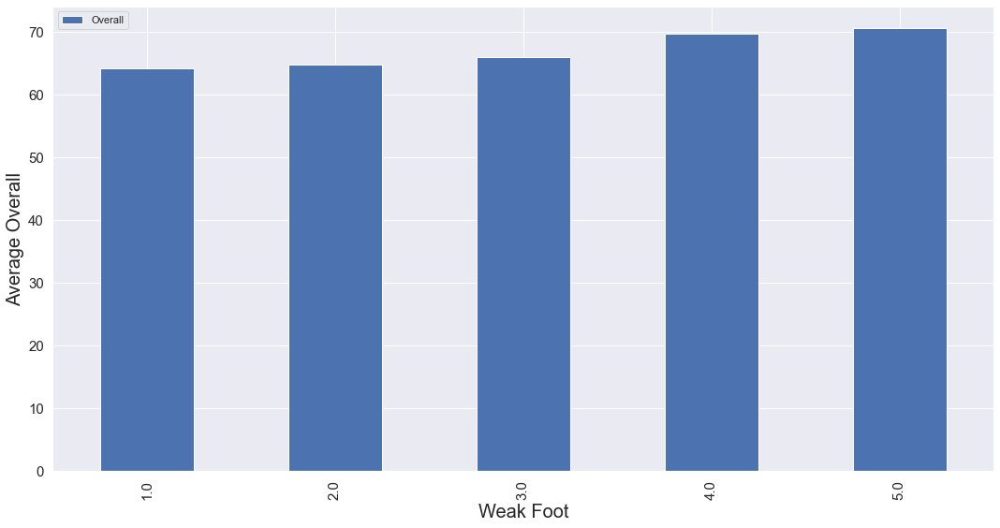

In [131]:
group = pd.DataFrame(fifa_df.groupby('Weak Foot')['Overall'].mean())

group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Weak Foot',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Preferred Foot——惯用脚

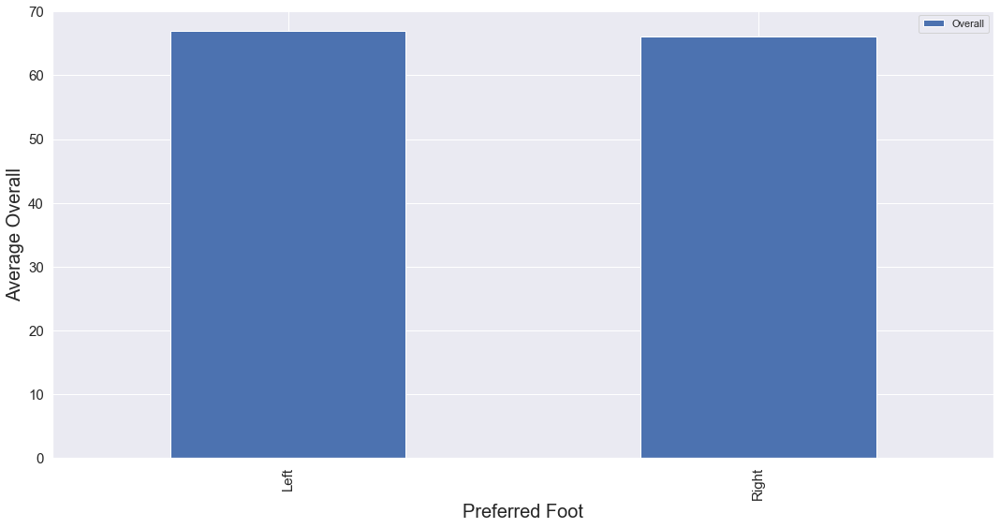

In [132]:
group = pd.DataFrame(fifa_df.groupby('Preferred Foot')['Overall'].mean())

group.plot(kind='bar',figsize=(15,8))
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
plt.xlabel('Preferred Foot',fontsize = 20)
plt.ylabel('Average Overall',fontsize = 20)
# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

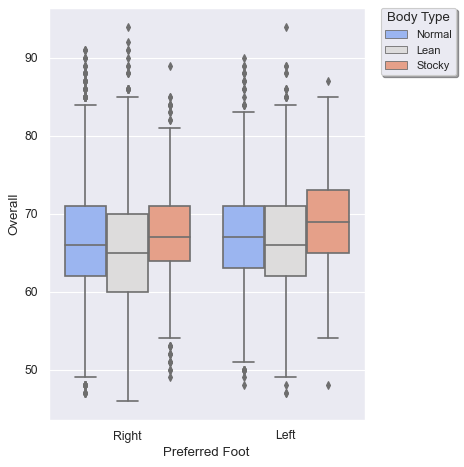

In [56]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(6,6), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.boxplot(x='Preferred Foot', y='Overall',hue='Body Type', palette='coolwarm', data=fifa_df)
plt.legend(frameon=True, fontsize='small', shadow='True', title='Body Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

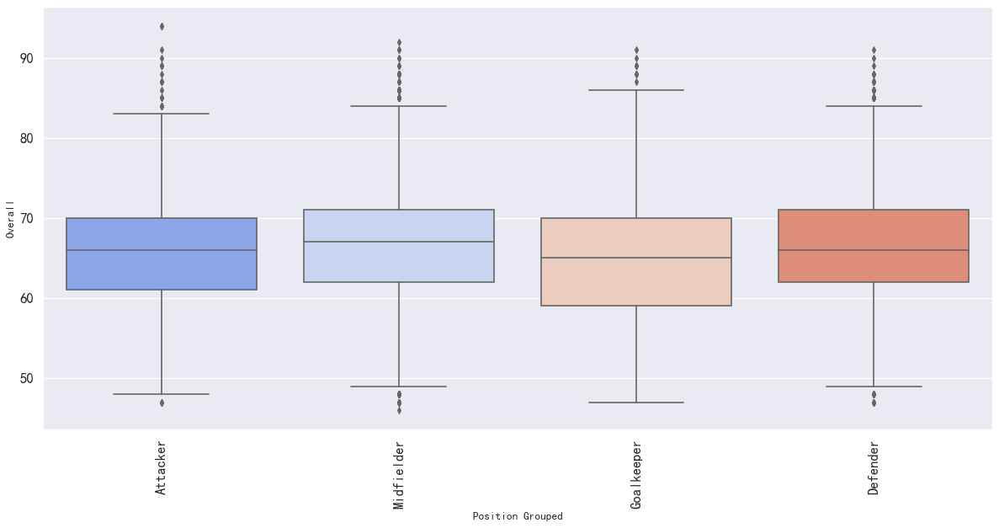

In [121]:
# Slightly alter the figure size to make it more horizontal.
plt.figure(figsize=(15,8), dpi=80, facecolor='w', edgecolor='k', frameon='True')

sns.boxplot(x='Position Grouped', y='Overall', palette='coolwarm', data=fifa_df)
#plt.legend(frameon=True, fontsize='small', shadow='True', title='Body Type', bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation='vertical', fontsize = 15)
plt.yticks(fontsize = 15)
# plot legend

# Automatically adjust subplot params so that the subplotS fits in to the figure area.
plt.tight_layout()

# display the plot
plt.show()

Crossing	Finishing	HeadingAccuracy	ShortPassing	Volleys	Dribbling	Curve	FKAccuracy	LongPassing	BallControl	Acceleration	SprintSpeed	Agility	Reactions	Balance	ShotPower	Jumping	Stamina	Strength	LongShots	Aggression	Interceptions	Positioning	Vision	Penalties	Composure	Marking	StandingTackle	SlidingTackle	GKDiving	GKHandling	GKKicking	GKPositioning	GKReflexes	Height_in_ms	Weight_in_kgs	Wage_in_Th	Value_in_M	Release_Clause_in_M

In [93]:
fifa_df.columns

Index(['Name', 'Age', 'Age_Group', 'Good_Yrs_left', 'Nationality', 'Overall', 'Potential', 'Club', 'Preferred Foot', 'International Reputation', 'Weak Foot', 'Skill Moves', 'Work Rate', 'Body Type', 'Position', 'Jersey Number', 'Joined', 'Contract Valid Until', 'Yrs_left_on_contract', 'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes', 'Height_in_ms', 'Weight_in_kgs', 'Wage_in_Th', 'Value_in_M', 'Release_Clause_in_M', 'Position Grouped'], dtype='object')

In [140]:
num_cols


['Overall',
 'Crossing',
 'Finishing',
 'HeadingAccuracy',
 'ShortPassing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FKAccuracy',
 'LongPassing',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Reactions',
 'Balance',
 'ShotPower',
 'Jumping',
 'Stamina',
 'Strength',
 'LongShots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Marking',
 'StandingTackle',
 'SlidingTackle',
 'GKDiving',
 'GKHandling',
 'GKKicking',
 'GKPositioning',
 'GKReflexes',
 'Age',
 'Height_in_ms',
 'Weight_in_kgs',
 'Yrs_left_on_contract',
 'Good_Yrs_left']

数值型变量与overall关系（按需画）

In [46]:
def num_scatterplot(var_list):
    for var in var_list:
        plt.figure(figsize=(10,6))
        #plt.subplot(3,2,var_list.index(var)+1)
        ax=sns.scatterplot(x=var,y='Overall',data=fifa_df,size = .5) #,size = .5
        # 调整xlabel的字体大小
        ax.xaxis.label.set_size(15)
        # 调整ylabel的字体大小
        ax.yaxis.label.set_size(15)
        plt.tick_params(labelsize=15) 
    #plt.tight_layout()
    plt.show()

    

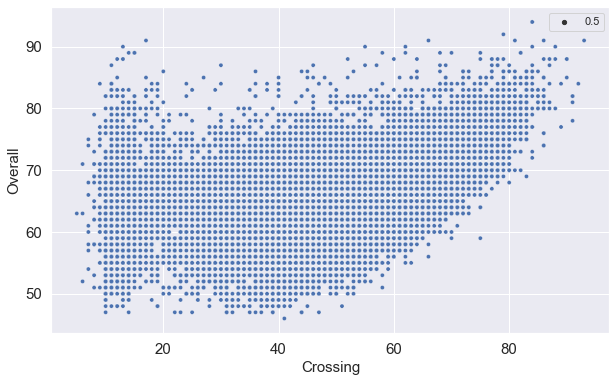

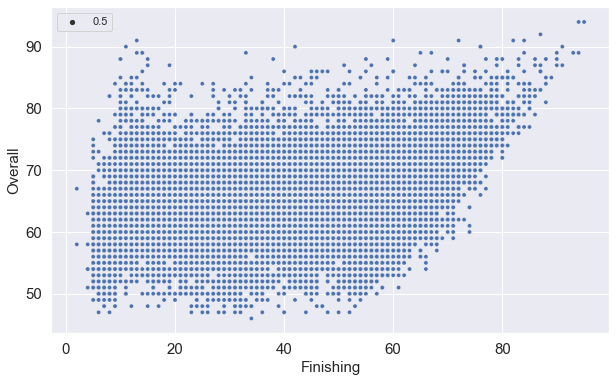

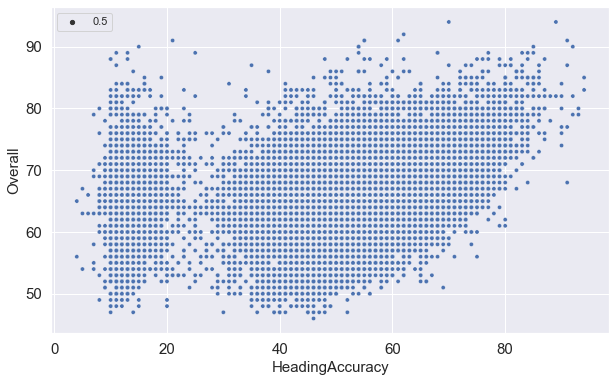

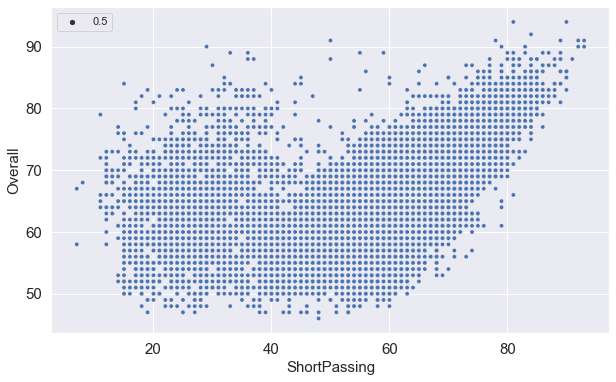

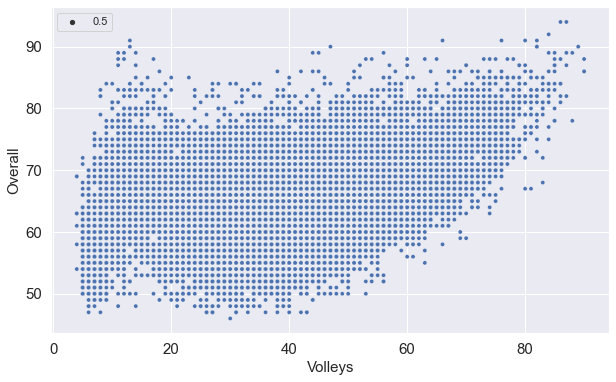

...

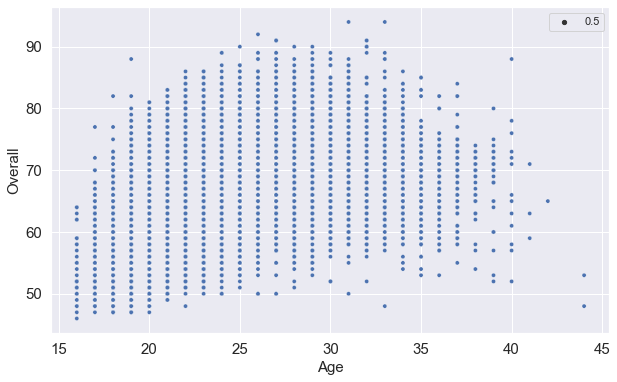

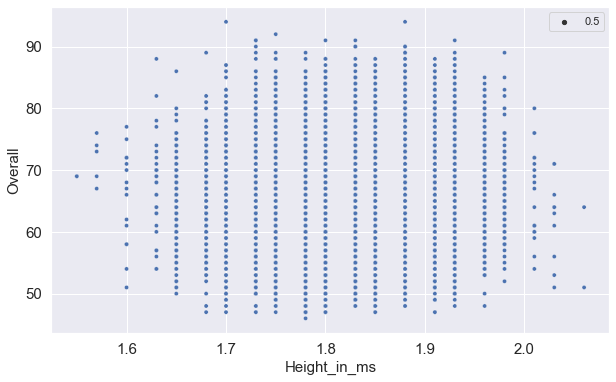

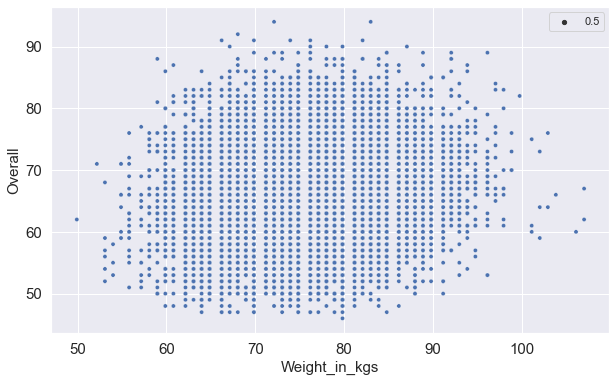

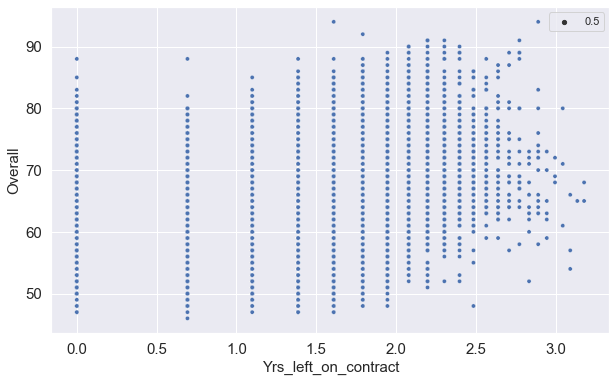

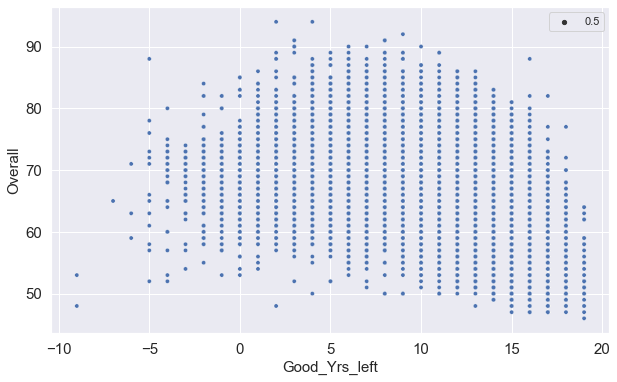

In [47]:
#var_list = ['Crossing','Finishing','HeadingAccuracy','ShortPassing']
'''var_list  = [ 'Reactions','Composure','Height_in_ms','Yrs_left_on_contract','Good_Yrs_left','Weight_in_kgs']
var_list = ['Finishing','ShortPassing','BallControl','Interceptions','StandingTackle','SlidingTackle']'''
num_scatterplot(num_cols[1:])

In [70]:
def num_scatterplot(var_list):
    plt.figure(figsize=(12,9))
    for var in var_list:
        plt.subplot(3,2,var_list.index(var)+1)
        ax=sns.scatterplot(x=var,y='Overall',data=fifa_df,size = .3) #,size = .5
        # 调整xlabel的字体大小
        ax.xaxis.label.set_size(15)
        # 调整ylabel的字体大小
        ax.yaxis.label.set_size(15)
        plt.tick_params(labelsize=15) 
    plt.tight_layout()
    plt.show()


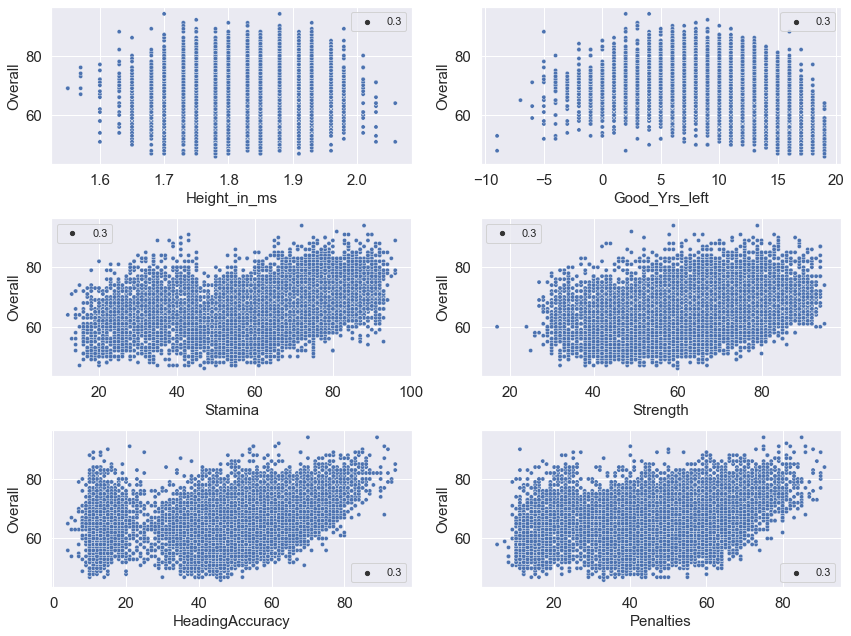

In [73]:
#var_others  = [ 'Reactions','Composure','Height_in_ms','Yrs_left_on_contract','Good_Yrs_left','Weight_in_kgs']
var_roles = ['Height_in_ms','Good_Yrs_left','Stamina','Strength',
             'HeadingAccuracy','Penalties']
num_scatterplot(var_roles)

<Figure size 1440x1440 with 0 Axes>

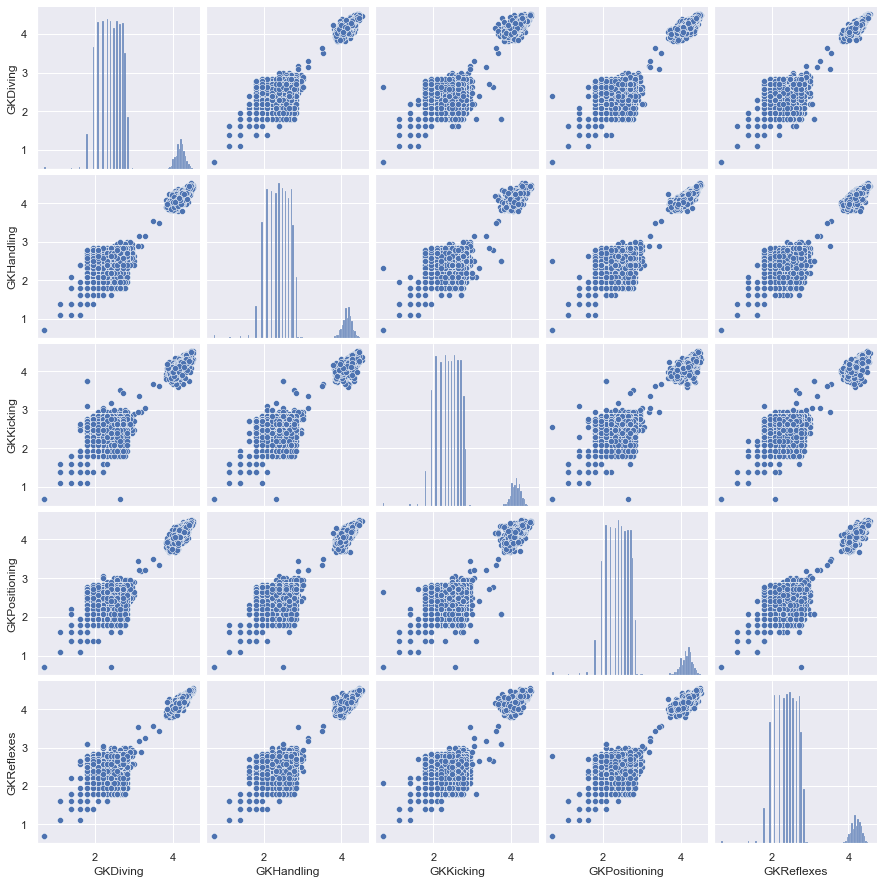

In [51]:
plt.figure(figsize=(20,20))
sns.pairplot(fifa_df[log_cols[1:]])
plt.show()


In [56]:
fifa_df.var()

Age                          21.872749
Good_Yrs_left                21.872749
Overall                      48.365032
Potential                    38.120310
International Reputation      0.158994
Weak Foot                     0.436386
Skill Moves                   0.577635
Jersey Number               258.315286
Joined                        4.595783
Contract Valid Until          1.637985
Yrs_left_on_contract          0.328530
Crossing                    343.354723
Finishing                   376.724483
HeadingAccuracy             304.747823
ShortPassing                220.201291
Volleys                     311.910026
Dribbling                   363.586695
Curve                       343.641519
FKAccuracy                  310.336748
LongPassing                 237.711809
BallControl                 283.411093
Acceleration                226.377320
SprintSpeed                 217.216708
Agility                     220.449409
Reactions                    81.837122
Balance                  

### 相关性热力图

In [48]:
fifa_df.shape

(16393, 56)

In [117]:
num_cols

['Overall',
 'Crossing',
 'Finishing',
 'HeadingAccuracy',
 'ShortPassing',
 'Volleys',
 'Dribbling',
 'Curve',
 'FKAccuracy',
 'LongPassing',
 'BallControl',
 'Acceleration',
 'SprintSpeed',
 'Agility',
 'Reactions',
 'Balance',
 'ShotPower',
 'Jumping',
 'Stamina',
 'Strength',
 'LongShots',
 'Aggression',
 'Interceptions',
 'Positioning',
 'Vision',
 'Penalties',
 'Composure',
 'Marking',
 'StandingTackle',
 'SlidingTackle',
 'GKDiving',
 'GKHandling',
 'GKKicking',
 'GKPositioning',
 'GKReflexes',
 'Age',
 'Height_in_ms',
 'Weight_in_kgs',
 'Value_in_M',
 'Wage_in_Th',
 'Yrs_left_on_contract',
 'Release_Clause_in_M',
 'Good_Yrs_left']

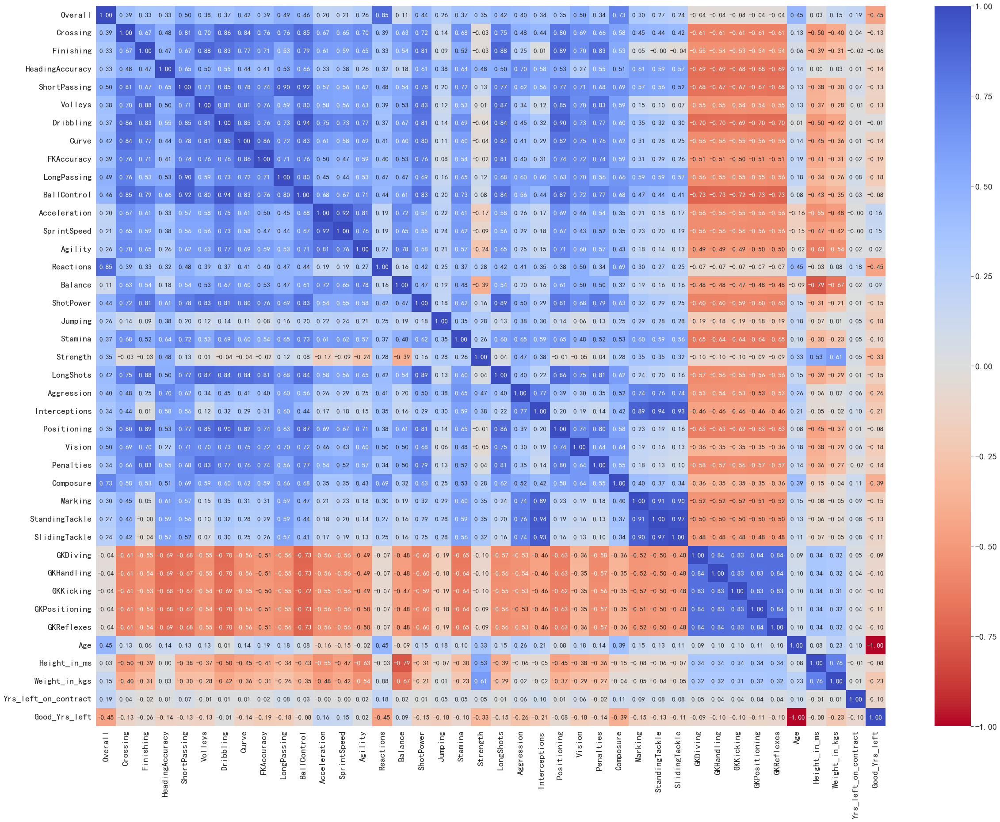

In [137]:
# num_cols是所有数值型变量
cor = fifa_df[num_cols].corr()  #相关性

#解决中文显示问题
plt.rcParams["font.sans-serif"] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False  # 减号unicode编码

plt.figure(figsize = (40,30))
#sns.set(style="darkgrid")
ax = sns.heatmap(cor,annot=True,
            cmap='coolwarm_r',#sns.cubehelix_palette(as_cmap=True),#'YlGnBu',
                 #sns.cubehelix_palette(as_cmap=True),#设置热力图颜色
            annot_kws={'size': 15},
            fmt='.2f', # 字符串格式代码
            vmin = -1,
            vmax = 1
           )
''''''

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)  #设置颜色条字体大小

plt.yticks(fontsize = 20)
plt.xticks(rotation='vertical', fontsize = 20)
#plt.title("变量相关性热力图",fontsize=20)
#plt.savefig('relevance.png')#保存图片
plt.show()


In [78]:
cols = ['Overall','Crossing','Finishing','HeadingAccuracy','ShortPassing','Volleys','Dribbling','Curve','FKAccuracy','LongPassing', \
        'BallControl','Acceleration','SprintSpeed','Agility','Reactions','Balance','ShotPower','Jumping','Stamina','Strength', \
        'LongShots','Aggression','Interceptions','Positioning','Vision','Penalties','Composure','Marking','StandingTackle', \
        'SlidingTackle','GKDiving','GKHandling','GKKicking','GKPositioning','GKReflexes',
         'Height_in_ms', 'Weight_in_kgs','Yrs_left_on_contract','Good_Yrs_left']

len(cols)

39

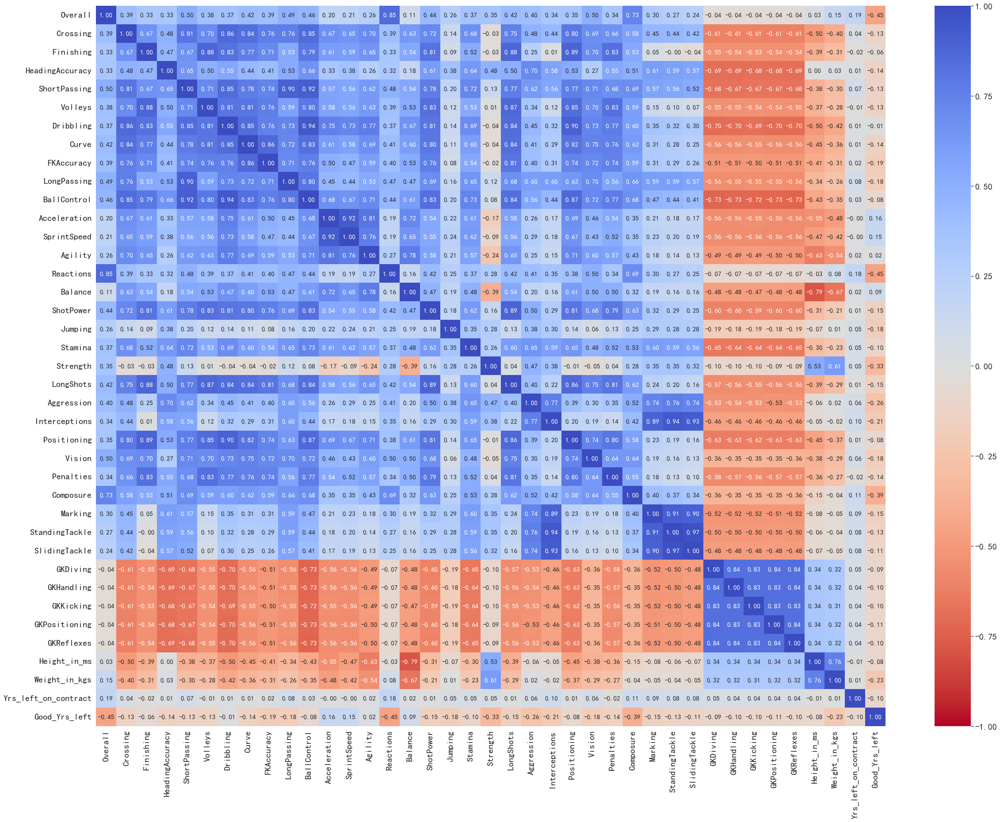

In [80]:
# cols是所有数值型变量
cor = fifa_df[cols].corr()  #相关性

#解决中文显示问题
plt.rcParams["font.sans-serif"] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False  # 减号unicode编码

plt.figure(figsize = (40,30))
#sns.set(style="darkgrid")
ax = sns.heatmap(cor,annot=True,
            cmap='coolwarm_r',#sns.cubehelix_palette(as_cmap=True),#'YlGnBu',
                 #sns.cubehelix_palette(as_cmap=True),#设置热力图颜色
            annot_kws={'size': 15},
            fmt='.2f', # 字符串格式代码
            vmin = -1,
            vmax = 1
           )
''''''

cbar = ax.collections[0].colorbar
cbar.ax.tick_params(labelsize=20)  #设置颜色条字体大小

plt.yticks(fontsize = 20)
plt.xticks(rotation='vertical', fontsize = 20)
#plt.title("变量相关性热力图",fontsize=20)
#plt.savefig('relevance.png')#保存图片
plt.show()


### 处理多分类变量

In [62]:
fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Position Grouped
2744,F. Tissone,31,Between 30-35,4,Argentina,73,73,CD Nacional,Right,2.0,3.0,3.0,Medium/ Medium,Normal,CDM,12.0,2018,2019,0.693147,59.0,58.0,54.0,74.0,67.0,64.0,69.0,73.0,72.0,72.0,60.0,57.0,61.0,70.0,59.0,83.0,78.0,72.0,71.0,68.0,80.0,73.0,66.0,65.0,59.0,69.0,72.0,74.0,65.0,2.302585,1.945910,2.484907,2.708050,2.708050,1.80,79.83,2.302585,1.308333,1.902108,Midfielder
8955,Júnior Negão,31,Between 30-35,4,Brazil,66,66,Ulsan Hyundai FC,Left,1.0,2.0,3.0,Medium/ Medium,Normal,ST,30.0,2018,2021,1.386294,41.0,68.0,59.0,57.0,70.0,66.0,64.0,52.0,58.0,64.0,68.0,69.0,63.0,62.0,53.0,60.0,52.0,62.0,76.0,55.0,73.0,23.0,67.0,57.0,59.0,53.0,34.0,33.0,34.0,2.639057,2.079442,1.945910,2.833213,2.302585,1.88,83.01,1.386294,0.451076,0.542324,Attacker
10435,S. O'Neill,24,Between 20-25,11,United States,65,70,Orlando City SC,Right,1.0,2.0,2.0,Medium/ Medium,Normal,RCB,12.0,2018,2021,1.386294,46.0,48.0,49.0,64.0,42.0,60.0,59.0,43.0,60.0,62.0,59.0,67.0,53.0,70.0,49.0,62.0,63.0,58.0,80.0,51.0,67.0,62.0,53.0,54.0,42.0,59.0,62.0,63.0,63.0,2.833213,1.945910,1.945910,2.397895,2.772589,1.88,86.18,1.098612,0.482426,0.683097,Defender
15391,S. Sidler,19,Below 20,16,Switzerland,59,72,FC Luzern,Right,1.0,4.0,2.0,Medium/ Medium,Lean,LB,34.0,2016,2019,1.386294,52.0,49.0,55.0,59.0,40.0,62.0,45.0,37.0,55.0,56.0,69.0,62.0,64.0,53.0,60.0,43.0,66.0,64.0,55.0,41.0,51.0,52.0,47.0,46.0,38.0,46.0,55.0,62.0,61.0,1.945910,2.197225,1.945910,2.302585,2.397895,1.85,72.12,0.693147,0.231112,0.431782,Defender
18077,S. Al Saeed,19,Below 20,16,Saudi Arabia,50,65,Al Taawoun,Right,1.0,3.0,2.0,High/ Medium,Lean,CM,44.0,2018,2021,1.386294,33.0,35.0,43.0,57.0,31.0,46.0,36.0,34.0,50.0,55.0,64.0,63.0,56.0,49.0,80.0,40.0,63.0,44.0,40.0,34.0,51.0,42.0,44.0,50.0,44.0,45.0,37.0,44.0,48.0,2.772589,2.079442,2.302585,2.397895,2.564949,1.73,64.86,0.693147,0.058269,0.131028,Midfielder


In [45]:
fifa_df.shape

(16393, 59)

In [63]:
# 生成哑变量 （有k类就生成k-1个哑变量）
dummy_age = pd.get_dummies(fifa_df[['Age_Group']], prefix='Age_Group', drop_first=True)
dummy_preferred_foot = pd.get_dummies(fifa_df[['Preferred Foot']], prefix='Preferred_Foot', drop_first=True)
dummy_work_rate = pd.get_dummies(fifa_df[['Work Rate']], prefix='Work_Rate', drop_first=True)
dummy_body_type = pd.get_dummies(fifa_df[['Body Type']], prefix='Body_Type', drop_first=True)
dummy_position_type = pd.get_dummies(fifa_df[['Position Grouped']], prefix='Position Grouped', drop_first=True)

# Adding the results to the original dataframes
fifa_df = pd.concat([fifa_df, dummy_age], axis=1)
fifa_df = pd.concat([fifa_df, dummy_preferred_foot], axis=1)
fifa_df = pd.concat([fifa_df, dummy_work_rate], axis=1)
fifa_df = pd.concat([fifa_df, dummy_body_type], axis=1)
fifa_df = pd.concat([fifa_df, dummy_position_type], axis=1)


fifa_df.head()

,Name,Age,Age_Group,Good_Yrs_left,Nationality,Overall,Potential,Club,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Position,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Position Grouped,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position Grouped_Defender,Position Grouped_Goalkeeper,Position Grouped_Midfielder
2744,F. Tissone,31,Between 30-35,4,Argentina,73,73,CD Nacional,Right,2.0,3.0,3.0,Medium/ Medium,Normal,CDM,12.0,2018,2019,0.693147,59.0,58.0,54.0,74.0,67.0,64.0,69.0,73.0,72.0,72.0,60.0,57.0,61.0,70.0,59.0,83.0,78.0,72.0,71.0,68.0,80.0,73.0,66.0,65.0,59.0,69.0,72.0,74.0,65.0,2.302585,1.945910,2.484907,2.708050,2.708050,1.80,79.83,2.302585,1.308333,1.902108,Midfielder,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1
8955,Júnior Negão,31,Between 30-35,4,Brazil,66,66,Ulsan Hyundai FC,Left,1.0,2.0,3.0,Medium/ Medium,Normal,ST,30.0,2018,2021,1.386294,41.0,68.0,59.0,57.0,70.0,66.0,64.0,52.0,58.0,64.0,68.0,69.0,63.0,62.0,53.0,60.0,52.0,62.0,76.0,55.0,73.0,23.0,67.0,57.0,59.0,53.0,34.0,33.0,34.0,2.639057,2.079442,1.945910,2.833213,2.302585,1.88,83.01,1.386294,0.451076,0.542324,Attacker,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
10435,S. O'Neill,24,Between 20-25,11,United States,65,70,Orlando City SC,Right,1.0,2.0,2.0,Medium/ Medium,Normal,RCB,12.0,2018,2021,1.386294,46.0,48.0,49.0,64.0,42.0,60.0,59.0,43.0,60.0,62.0,59.0,67.0,53.0,70.0,49.0,62.0,63.0,58.0,80.0,51.0,67.0,62.0,53.0,54.0,42.0,59.0,62.0,63.0,63.0,2.833213,1.945910,1.945910,2.397895,2.772589,1.88,86.18,1.098612,0.482426,0.683097,Defender,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,0
15391,S. Sidler,19,Below 20,16,Switzerland,59,72,FC Luzern,Right,1.0,4.0,2.0,Medium/ Medium,Lean,LB,34.0,2016,2019,1.386294,52.0,49.0,55.0,59.0,40.0,62.0,45.0,37.0,55.0,56.0,69.0,62.0,64.0,53.0,60.0,43.0,66.0,64.0,55.0,41.0,51.0,52.0,47.0,46.0,38.0,46.0,55.0,62.0,61.0,1.945910,2.197225,1.945910,2.302585,2.397895,1.85,72.12,0.693147,0.231112,0.431782,Defender,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0
18077,S. Al Saeed,19,Below 20,16,Saudi Arabia,50,65,Al Taawoun,Right,1.0,3.0,2.0,High/ Medium,Lean,CM,44.0,2018,2021,1.386294,33.0,35.0,43.0,57.0,31.0,46.0,36.0,34.0,50.0,55.0,64.0,63.0,56.0,49.0,80.0,40.0,63.0,44.0,40.0,34.0,51.0,42.0,44.0,50.0,44.0,45.0,37.0,44.0,48.0,2.772589,2.079442,2.302585,2.397895,2.564949,1.73,64.86,0.693147,0.058269,0.131028,Midfielder,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1


In [64]:
fifa_df.shape

(16393, 78)

In [65]:
# 删掉已经重编码的分类变量

cols_to_drop = ['Age_Group','Preferred Foot','Work Rate','Body Type','Position Grouped','Position']
fifa_df = fifa_df.drop(cols_to_drop, axis=1)

print('Shape of final_df: {}'.format(fifa_df.shape))

Shape of final_df: (16393, 72)


备份数据：之后都用fifa_org_df

In [66]:
fifa_org_df = fifa_df.copy()
print(fifa_org_df.shape)
print(fifa_df.shape)

(16393, 72)
(16393, 72)


In [67]:
fifa_org_df.head()

,Name,Age,Good_Yrs_left,Nationality,Overall,Potential,Club,International Reputation,Weak Foot,Skill Moves,Jersey Number,Joined,Contract Valid Until,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Wage_in_Th,Value_in_M,Release_Clause_in_M,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position Grouped_Defender,Position Grouped_Goalkeeper,Position Grouped_Midfielder
2744,F. Tissone,31,4,Argentina,73,73,CD Nacional,2.0,3.0,3.0,12.0,2018,2019,0.693147,59.0,58.0,54.0,74.0,67.0,64.0,69.0,73.0,72.0,72.0,60.0,57.0,61.0,70.0,59.0,83.0,78.0,72.0,71.0,68.0,80.0,73.0,66.0,65.0,59.0,69.0,72.0,74.0,65.0,2.302585,1.945910,2.484907,2.708050,2.708050,1.80,79.83,2.302585,1.308333,1.902108,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1
8955,Júnior Negão,31,4,Brazil,66,66,Ulsan Hyundai FC,1.0,2.0,3.0,30.0,2018,2021,1.386294,41.0,68.0,59.0,57.0,70.0,66.0,64.0,52.0,58.0,64.0,68.0,69.0,63.0,62.0,53.0,60.0,52.0,62.0,76.0,55.0,73.0,23.0,67.0,57.0,59.0,53.0,34.0,33.0,34.0,2.639057,2.079442,1.945910,2.833213,2.302585,1.88,83.01,1.386294,0.451076,0.542324,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
10435,S. O'Neill,24,11,United States,65,70,Orlando City SC,1.0,2.0,2.0,12.0,2018,2021,1.386294,46.0,48.0,49.0,64.0,42.0,60.0,59.0,43.0,60.0,62.0,59.0,67.0,53.0,70.0,49.0,62.0,63.0,58.0,80.0,51.0,67.0,62.0,53.0,54.0,42.0,59.0,62.0,63.0,63.0,2.833213,1.945910,1.945910,2.397895,2.772589,1.88,86.18,1.098612,0.482426,0.683097,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,0
15391,S. Sidler,19,16,Switzerland,59,72,FC Luzern,1.0,4.0,2.0,34.0,2016,2019,1.386294,52.0,49.0,55.0,59.0,40.0,62.0,45.0,37.0,55.0,56.0,69.0,62.0,64.0,53.0,60.0,43.0,66.0,64.0,55.0,41.0,51.0,52.0,47.0,46.0,38.0,46.0,55.0,62.0,61.0,1.945910,2.197225,1.945910,2.302585,2.397895,1.85,72.12,0.693147,0.231112,0.431782,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0
18077,S. Al Saeed,19,16,Saudi Arabia,50,65,Al Taawoun,1.0,3.0,2.0,44.0,2018,2021,1.386294,33.0,35.0,43.0,57.0,31.0,46.0,36.0,34.0,50.0,55.0,64.0,63.0,56.0,49.0,80.0,40.0,63.0,44.0,40.0,34.0,51.0,42.0,44.0,50.0,44.0,45.0,37.0,44.0,48.0,2.772589,2.079442,2.302585,2.397895,2.564949,1.73,64.86,0.693147,0.058269,0.131028,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1


删除不用于预测的列

In [68]:
columns_to_drop = ['Name','Age', 'Potential', 'Nationality', 'Club', 'Jersey Number',
                   'Joined', 'Contract Valid Until']

fifa_org_df = fifa_org_df.drop(columns_to_drop, axis=1)
fifa_org_df.head()

,Good_Yrs_left,Overall,International Reputation,Weak Foot,Skill Moves,Yrs_left_on_contract,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Height_in_ms,Weight_in_kgs,Age_Group_Between 20-25,Age_Group_Between 25-30,Age_Group_Between 30-35,Age_Group_Between 35-40,Age_Group_Above 40,Preferred_Foot_Right,Work_Rate_High/ Low,Work_Rate_High/ Medium,Work_Rate_Low/ High,Work_Rate_Low/ Low,Work_Rate_Low/ Medium,Work_Rate_Medium/ High,Work_Rate_Medium/ Low,Work_Rate_Medium/ Medium,Body_Type_Normal,Body_Type_Stocky,Position Grouped_Defender,Position Grouped_Goalkeeper,Position Grouped_Midfielder
2744,4,73,2.0,3.0,3.0,0.693147,59.0,58.0,54.0,74.0,67.0,64.0,69.0,73.0,72.0,72.0,60.0,57.0,61.0,70.0,59.0,83.0,78.0,72.0,71.0,68.0,80.0,73.0,66.0,65.0,59.0,69.0,72.0,74.0,65.0,2.302585,1.945910,2.484907,2.708050,2.708050,1.80,79.83,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,1
8955,4,66,1.0,2.0,3.0,1.386294,41.0,68.0,59.0,57.0,70.0,66.0,64.0,52.0,58.0,64.0,68.0,69.0,63.0,62.0,53.0,60.0,52.0,62.0,76.0,55.0,73.0,23.0,67.0,57.0,59.0,53.0,34.0,33.0,34.0,2.639057,2.079442,1.945910,2.833213,2.302585,1.88,83.01,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0
10435,11,65,1.0,2.0,2.0,1.386294,46.0,48.0,49.0,64.0,42.0,60.0,59.0,43.0,60.0,62.0,59.0,67.0,53.0,70.0,49.0,62.0,63.0,58.0,80.0,51.0,67.0,62.0,53.0,54.0,42.0,59.0,62.0,63.0,63.0,2.833213,1.945910,1.945910,2.397895,2.772589,1.88,86.18,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,1,0,0
15391,16,59,1.0,4.0,2.0,1.386294,52.0,49.0,55.0,59.0,40.0,62.0,45.0,37.0,55.0,56.0,69.0,62.0,64.0,53.0,60.0,43.0,66.0,64.0,55.0,41.0,51.0,52.0,47.0,46.0,38.0,46.0,55.0,62.0,61.0,1.945910,2.197225,1.945910,2.302585,2.397895,1.85,72.12,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0
18077,16,50,1.0,3.0,2.0,1.386294,33.0,35.0,43.0,57.0,31.0,46.0,36.0,34.0,50.0,55.0,64.0,63.0,56.0,49.0,80.0,40.0,63.0,44.0,40.0,34.0,51.0,42.0,44.0,50.0,44.0,45.0,37.0,44.0,48.0,2.772589,2.079442,2.302585,2.397895,2.564949,1.73,64.86,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1


In [73]:
fifa_org_df.shape

(16393, 61)

In [69]:
fifa_org_df.to_csv("data_random.csv")